<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/se_vit3_50epoch_flower_D_se_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 12.0 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 375MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=64)
parser.add_argument("--nch_d", type = int, default=64)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=64, nch_d=64, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):

        x = self.conv3(x)
        x = self.bn(x)

        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
        x = self.se_block_0(x)
       # x = self.attention(x) - x
        #x = x + identity


      #  identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


      #  x =  self.shortcut(identity) + x

        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspo

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [01:58<00:00,  1.15s/it]


epoch: 0, lossD:0.948446106563494, lossG:6.417890622777846,lossG_fake:3.0947286920640074, lossG_real:3.3231619411301843 ,equality:-0.2284332490661769


evaluate:149.83738708496094,kid_mean:0.091690294444561, kid_std:0.02164408005774021,kid_:(tensor(0.0917), tensor(0.0216))


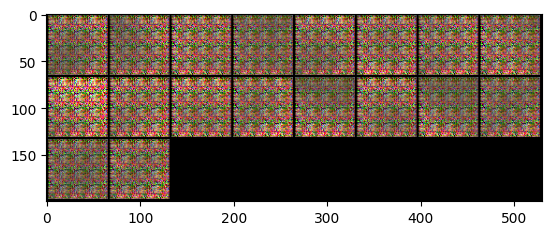

100%|██████████| 103/103 [00:26<00:00,  3.82it/s]


epoch: 1, lossD:0.9247199377967316, lossG:6.237118721008301,lossG_fake:3.4723858578691207, lossG_real:2.764732855037578 ,equality:0.7076530028315426


evaluate:141.19638061523438,kid_mean:0.09988317638635635, kid_std:0.03788651525974274,kid_:(tensor(0.0999), tensor(0.0379))


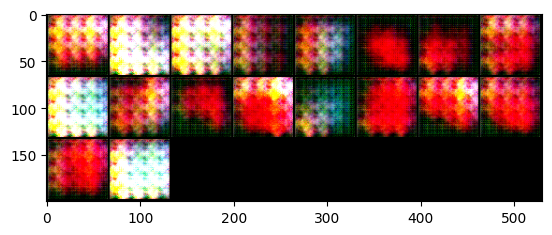

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 2, lossD:1.4224397661616501, lossG:3.690076362739489,lossG_fake:2.0256792792996157, lossG_real:1.6643971019578212 ,equality:0.36128217734179446


evaluate:128.71905517578125,kid_mean:0.08015187084674835, kid_std:0.04041445255279541,kid_:(tensor(0.0802), tensor(0.0404))


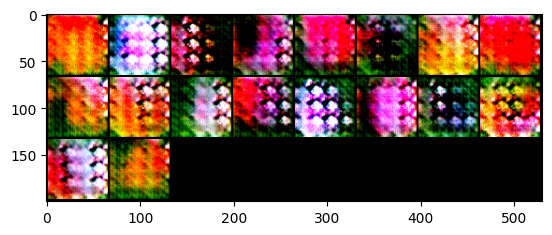

100%|██████████| 103/103 [00:27<00:00,  3.68it/s]


epoch: 3, lossD:1.4220467123013099, lossG:3.507988582537012,lossG_fake:1.9394133831690816, lossG_real:1.5685752144137632 ,equality:0.3708381687553184


evaluate:131.0172119140625,kid_mean:0.08645868301391602, kid_std:0.03865482658147812,kid_:(tensor(0.0865), tensor(0.0387))


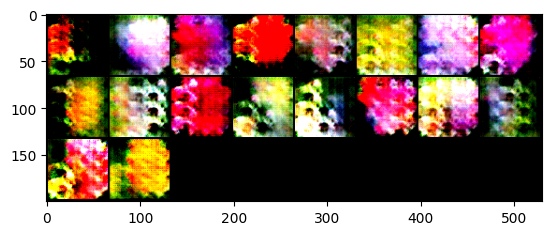

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 4, lossD:1.451411797004996, lossG:3.4483041508683883,lossG_fake:1.8833983158602299, lossG_real:1.5649058350081582 ,equality:0.3184924808520717


evaluate:121.30540466308594,kid_mean:0.08045676350593567, kid_std:0.0346246138215065,kid_:(tensor(0.0805), tensor(0.0346))


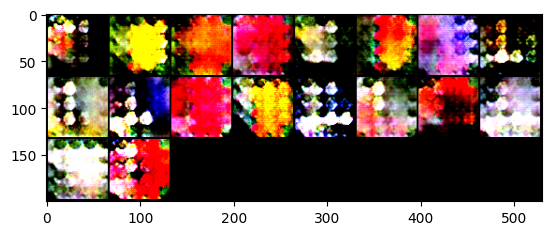

100%|██████████| 103/103 [00:27<00:00,  3.71it/s]


epoch: 5, lossD:1.4372472022343608, lossG:3.48953542200107,lossG_fake:1.9080530867993253, lossG_real:1.5814823230493416 ,equality:0.32657076374998373


evaluate:124.120361328125,kid_mean:0.08186902105808258, kid_std:0.04092193767428398,kid_:(tensor(0.0819), tensor(0.0409))


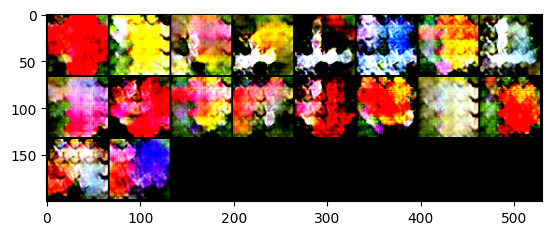

100%|██████████| 103/103 [00:27<00:00,  3.70it/s]


epoch: 6, lossD:1.4876465357623054, lossG:3.494178459482286,lossG_fake:1.9212972562289932, lossG_real:1.5728811893648313 ,equality:0.3484160668641618


evaluate:114.15424346923828,kid_mean:0.08250992745161057, kid_std:0.048276543617248535,kid_:(tensor(0.0825), tensor(0.0483))


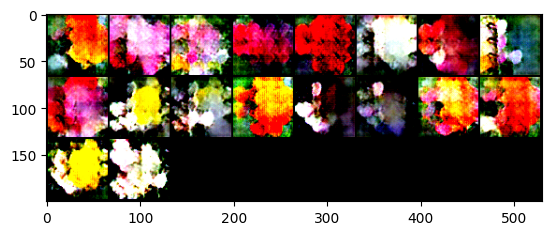

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 7, lossD:1.5107917762497096, lossG:3.382035250802642,lossG_fake:1.842032511257431, lossG_real:1.5400027302862371 ,equality:0.3020297809711938


evaluate:118.43302154541016,kid_mean:0.0777345597743988, kid_std:0.031553179025650024,kid_:(tensor(0.0777), tensor(0.0316))


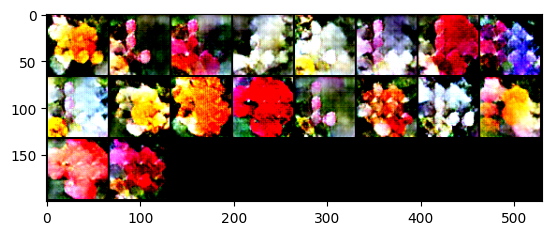

100%|██████████| 103/103 [00:27<00:00,  3.70it/s]


epoch: 8, lossD:1.4903987912298406, lossG:3.4637907847617435,lossG_fake:1.8879857653553047, lossG_real:1.575805010147465 ,equality:0.3121807552078397


evaluate:117.57827758789062,kid_mean:0.06824510544538498, kid_std:0.03300734981894493,kid_:(tensor(0.0682), tensor(0.0330))


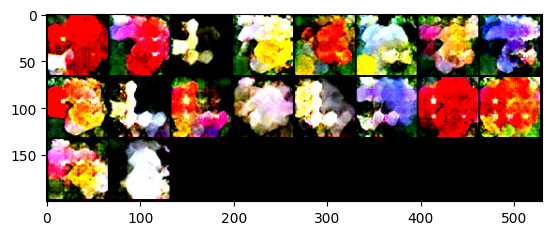

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 9, lossD:1.4497140906389476, lossG:3.490160104140495,lossG_fake:1.8706183615818763, lossG_real:1.6195417399545318 ,equality:0.25107662162734457


evaluate:117.40690612792969,kid_mean:0.08182401955127716, kid_std:0.035390570759773254,kid_:(tensor(0.0818), tensor(0.0354))


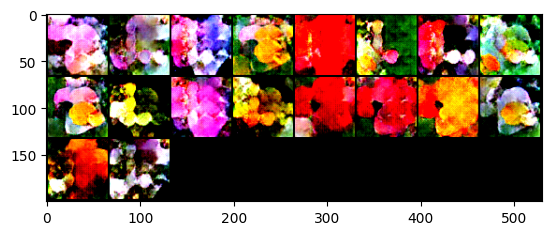

100%|██████████| 103/103 [00:27<00:00,  3.71it/s]


epoch: 10, lossD:1.453860171211576, lossG:3.530158489653208,lossG_fake:1.910768318812824, lossG_real:1.6193901633174674 ,equality:0.2913781554953565


evaluate:116.86787414550781,kid_mean:0.07716487348079681, kid_std:0.037621814757585526,kid_:(tensor(0.0772), tensor(0.0376))


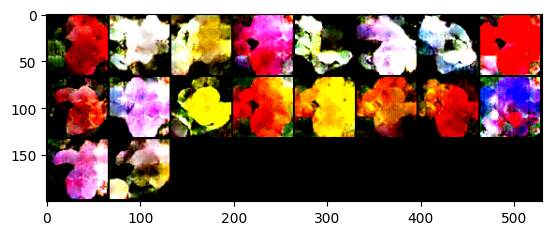

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 11, lossD:1.4370091030898604, lossG:3.5552597763468916,lossG_fake:1.896672673017076, lossG_real:1.6585871117207611 ,equality:0.23808556129631486


evaluate:119.13312530517578,kid_mean:0.07509464770555496, kid_std:0.03975895419716835,kid_:(tensor(0.0751), tensor(0.0398))


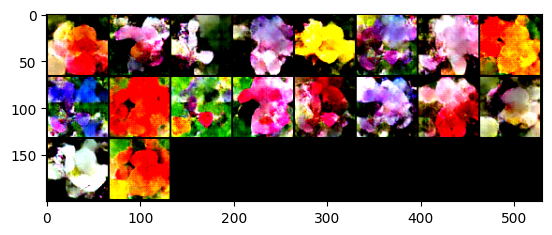

100%|██████████| 103/103 [00:27<00:00,  3.73it/s]


epoch: 12, lossD:1.3860371975065435, lossG:3.6553493796043024,lossG_fake:1.930314906592508, lossG_real:1.7250344643315065 ,equality:0.2052804422610015


evaluate:118.64435577392578,kid_mean:0.08757726848125458, kid_std:0.04531678929924965,kid_:(tensor(0.0876), tensor(0.0453))


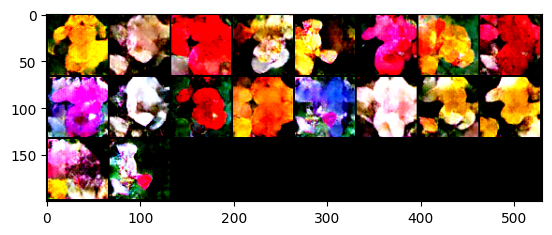

100%|██████████| 103/103 [00:27<00:00,  3.72it/s]


epoch: 13, lossD:1.3630997168207633, lossG:3.734387205642404,lossG_fake:1.9655600664685073, lossG_real:1.7688271443820693 ,equality:0.196732922086438


evaluate:119.76443481445312,kid_mean:0.09050930291414261, kid_std:0.04706853628158569,kid_:(tensor(0.0905), tensor(0.0471))


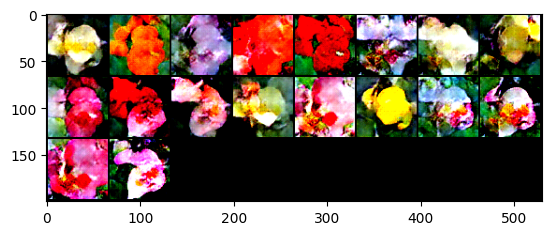

100%|██████████| 103/103 [00:27<00:00,  3.73it/s]


epoch: 14, lossD:1.3194586061736913, lossG:3.8031925252340373,lossG_fake:2.013240631922935, lossG_real:1.7899518778312553 ,equality:0.2232887540916797


evaluate:121.13882446289062,kid_mean:0.0798686295747757, kid_std:0.03984338417649269,kid_:(tensor(0.0799), tensor(0.0398))


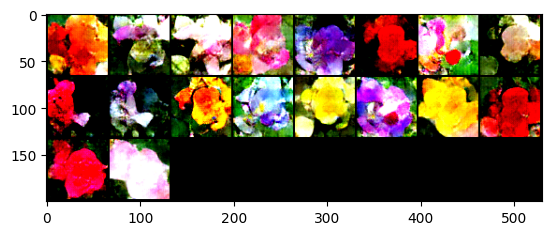

100%|██████████| 103/103 [00:27<00:00,  3.73it/s]


epoch: 15, lossD:1.2732444544440333, lossG:3.8834968863181696,lossG_fake:2.0277396090401028, lossG_real:1.8557572960853577 ,equality:0.1719823129547451


evaluate:121.03226470947266,kid_mean:0.0895744115114212, kid_std:0.042239949107170105,kid_:(tensor(0.0896), tensor(0.0422))


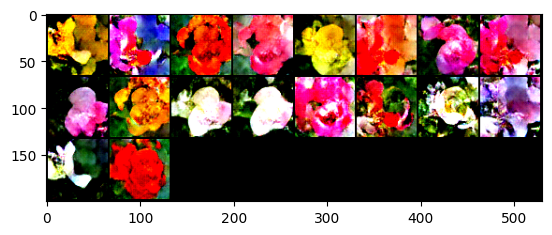

100%|██████████| 103/103 [00:27<00:00,  3.73it/s]


epoch: 16, lossD:1.2347149634824215, lossG:3.959695089210584,lossG_fake:2.0731790372468892, lossG_real:1.8865160363391764 ,equality:0.18666300090771282


evaluate:124.21312713623047,kid_mean:0.08159991353750229, kid_std:0.03650732710957527,kid_:(tensor(0.0816), tensor(0.0365))


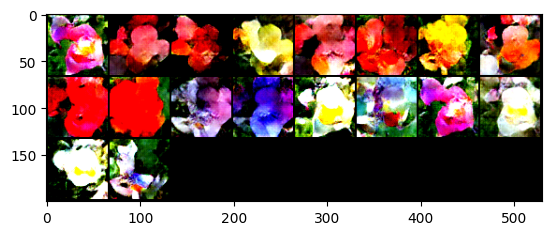

100%|██████████| 103/103 [00:27<00:00,  3.73it/s]


epoch: 17, lossD:1.1710904732491205, lossG:4.089335758709213,lossG_fake:2.0974272680514066, lossG_real:1.9919085173496922 ,equality:0.10551875070171435


evaluate:124.99146270751953,kid_mean:0.08680035918951035, kid_std:0.03964467719197273,kid_:(tensor(0.0868), tensor(0.0396))


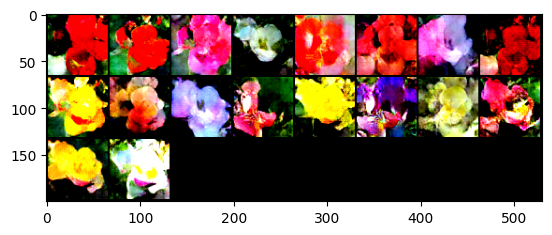

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 18, lossD:1.1440838474093131, lossG:4.187699815601978,lossG_fake:2.1871104992709114, lossG_real:2.000589316041724 ,equality:0.18652118322918732


evaluate:125.87245178222656,kid_mean:0.08685801178216934, kid_std:0.039286281913518906,kid_:(tensor(0.0869), tensor(0.0393))


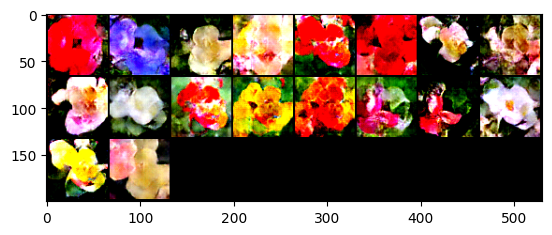

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 19, lossD:1.0877967407402482, lossG:4.276478892391168,lossG_fake:2.225280063823589, lossG_real:2.051198813811089 ,equality:0.17408125001249974


evaluate:126.6558609008789,kid_mean:0.08079154789447784, kid_std:0.038010310381650925,kid_:(tensor(0.0808), tensor(0.0380))


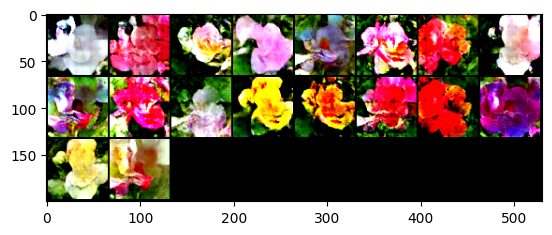

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 20, lossD:1.0526520988894899, lossG:4.464582153894369,lossG_fake:2.3255167209986345, lossG_real:2.13906545314974 ,equality:0.18645126784889454


evaluate:127.92010498046875,kid_mean:0.08437936753034592, kid_std:0.04845283180475235,kid_:(tensor(0.0844), tensor(0.0485))


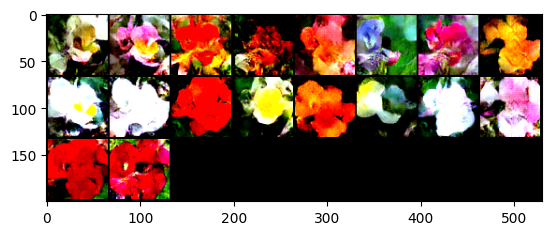

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 21, lossD:0.9882903674852501, lossG:4.542924107857121,lossG_fake:2.3624627433934258, lossG_real:2.1804613679358105 ,equality:0.1820013754576153


evaluate:128.1480712890625,kid_mean:0.08661676198244095, kid_std:0.04024616256356239,kid_:(tensor(0.0866), tensor(0.0402))


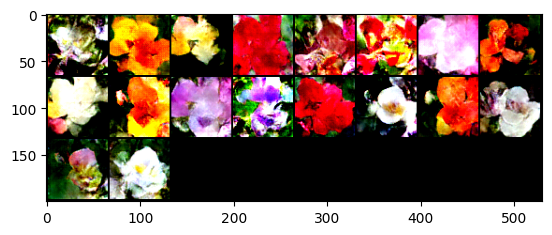

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 22, lossD:0.9506756556265562, lossG:4.647828940048958,lossG_fake:2.3948046848611924, lossG_real:2.253024272548342 ,equality:0.14178041231285032


evaluate:131.73074340820312,kid_mean:0.09137600660324097, kid_std:0.045143332332372665,kid_:(tensor(0.0914), tensor(0.0451))


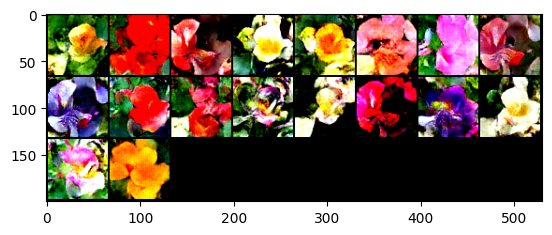

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 23, lossD:0.9544583868633196, lossG:4.759725283650519,lossG_fake:2.462925171967849, lossG_real:2.296800133094047 ,equality:0.16612503887380203


evaluate:130.2686767578125,kid_mean:0.09451714158058167, kid_std:0.0501956008374691,kid_:(tensor(0.0945), tensor(0.0502))


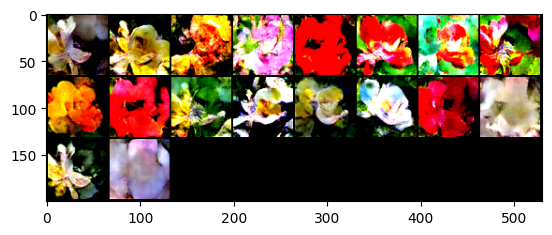

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 24, lossD:0.8930212522594674, lossG:4.827571507796501,lossG_fake:2.4682423194635263, lossG_real:2.3593291698150263 ,equality:0.10891314964850007


evaluate:129.44483947753906,kid_mean:0.09470677375793457, kid_std:0.0453672893345356,kid_:(tensor(0.0947), tensor(0.0454))


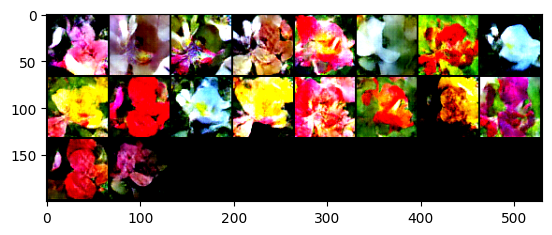

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 25, lossD:0.8865135586956172, lossG:4.90590526062308,lossG_fake:2.5002622213757153, lossG_real:2.4056430323031344 ,equality:0.09461918907258093


evaluate:131.224365234375,kid_mean:0.08610430359840393, kid_std:0.037699855864048004,kid_:(tensor(0.0861), tensor(0.0377))


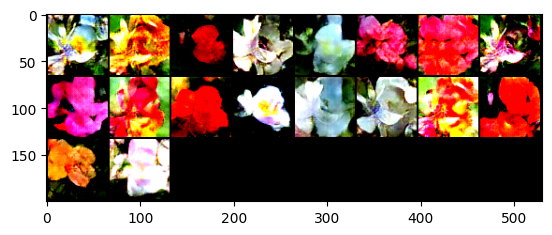

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 26, lossD:0.8266626848179159, lossG:5.007067972016566,lossG_fake:2.5920935579873983, lossG_real:2.4149744093996808 ,equality:0.1771191485877175


evaluate:130.14877319335938,kid_mean:0.09761533886194229, kid_std:0.05041654035449028,kid_:(tensor(0.0976), tensor(0.0504))


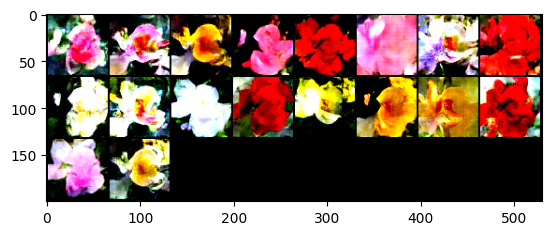

100%|██████████| 103/103 [00:27<00:00,  3.74it/s]


epoch: 27, lossD:0.7647981986548137, lossG:5.150966635028135,lossG_fake:2.6321444517200434, lossG_real:2.518822197775239 ,equality:0.11332225394480444


evaluate:131.4980010986328,kid_mean:0.09267468750476837, kid_std:0.046504728496074677,kid_:(tensor(0.0927), tensor(0.0465))


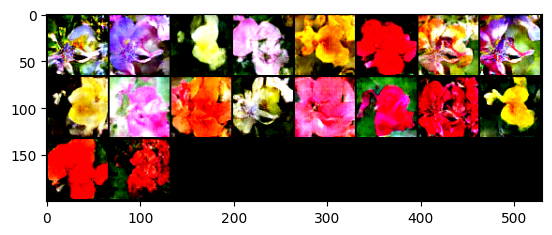

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 28, lossD:0.8199397108508545, lossG:5.165918678913302,lossG_fake:2.622592448030861, lossG_real:2.543326238984043 ,equality:0.07926620904681769


evaluate:134.00164794921875,kid_mean:0.09259839355945587, kid_std:0.04588046669960022,kid_:(tensor(0.0926), tensor(0.0459))


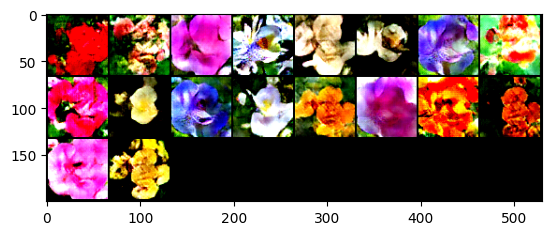

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 29, lossD:0.7048764800273098, lossG:5.242635273238988,lossG_fake:2.647480692099599, lossG_real:2.5951545684082995 ,equality:0.0523261236912993


evaluate:133.65676879882812,kid_mean:0.1023852601647377, kid_std:0.049401577562093735,kid_:(tensor(0.1024), tensor(0.0494))


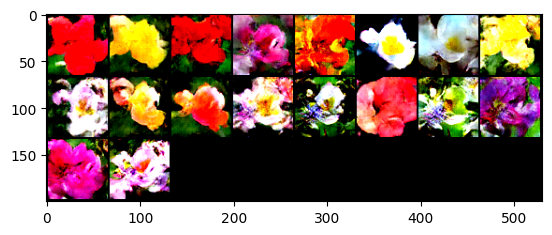

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 30, lossD:0.6989967556833063, lossG:5.425528049468994,lossG_fake:2.7533841387739457, lossG_real:2.672143903172132 ,equality:0.08124023560181381


evaluate:133.24771118164062,kid_mean:0.08838271349668503, kid_std:0.03950705751776695,kid_:(tensor(0.0884), tensor(0.0395))


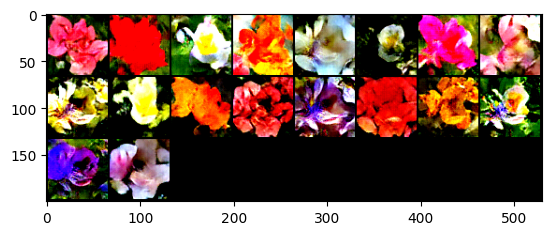

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 31, lossD:0.6945493564154338, lossG:5.45581981510792,lossG_fake:2.7829898514793916, lossG_real:2.6728299520548107 ,equality:0.11015989942458093


evaluate:132.3865203857422,kid_mean:0.09731990844011307, kid_std:0.041696928441524506,kid_:(tensor(0.0973), tensor(0.0417))


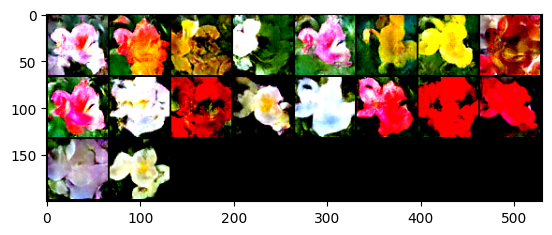

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 32, lossD:0.6423102978942463, lossG:5.547775347255966,lossG_fake:2.7865231957250427, lossG_real:2.761252179307845 ,equality:0.025271016417197867


evaluate:131.98431396484375,kid_mean:0.10084691643714905, kid_std:0.04066300764679909,kid_:(tensor(0.1008), tensor(0.0407))


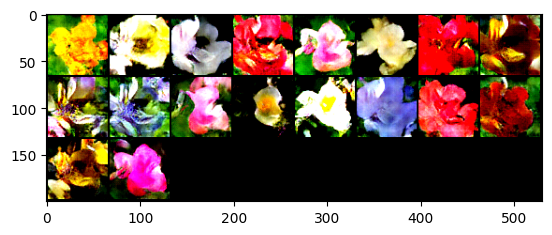

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 33, lossD:0.6302211618105185, lossG:5.626749182210385,lossG_fake:2.831685596299403, lossG_real:2.795063568550406 ,equality:0.03662202774899681


evaluate:132.4578094482422,kid_mean:0.10016284883022308, kid_std:0.04346683248877525,kid_:(tensor(0.1002), tensor(0.0435))


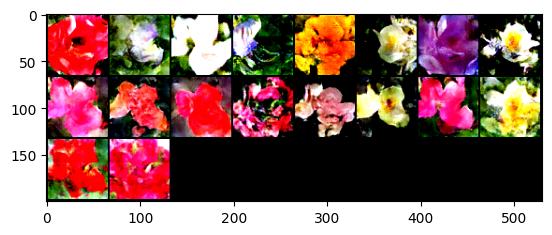

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 34, lossD:0.6257959437891117, lossG:5.631055253223308,lossG_fake:2.8571254200148353, lossG_real:2.7739298430461328 ,equality:0.0831955769687025


evaluate:131.14073181152344,kid_mean:0.0919743999838829, kid_std:0.04199595749378204,kid_:(tensor(0.0920), tensor(0.0420))


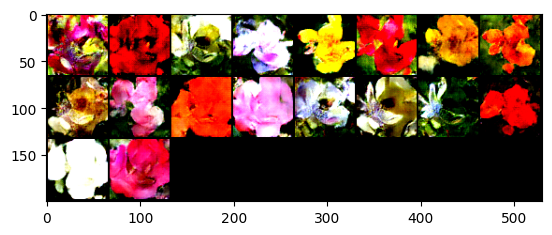

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 35, lossD:0.5782285562707382, lossG:5.7179953936234265,lossG_fake:2.863322796173466, lossG_real:2.8546725905057295 ,equality:0.008650205667736444


evaluate:130.9817352294922,kid_mean:0.09619424492120743, kid_std:0.05005691573023796,kid_:(tensor(0.0962), tensor(0.0501))


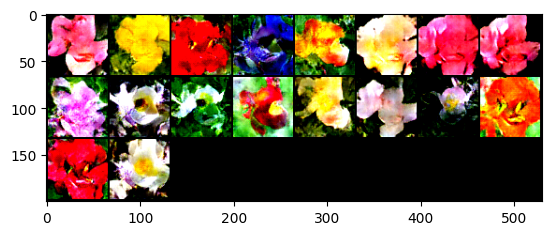

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 36, lossD:0.6199843453116787, lossG:5.717968500933601,lossG_fake:2.8810894322916143, lossG_real:2.836879066471915 ,equality:0.044210365819699504


evaluate:130.74951171875,kid_mean:0.09305660426616669, kid_std:0.04246143996715546,kid_:(tensor(0.0931), tensor(0.0425))


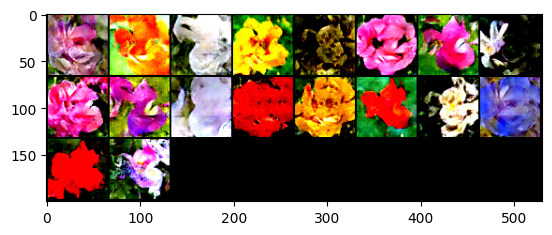

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 37, lossD:0.6219481762896464, lossG:5.793430133930688,lossG_fake:2.896324557586781, lossG_real:2.8971055682423046 ,equality:-0.0007810106555234952


evaluate:130.36021423339844,kid_mean:0.09175542742013931, kid_std:0.042643435299396515,kid_:(tensor(0.0918), tensor(0.0426))


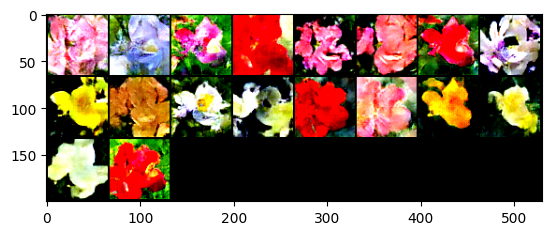

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 38, lossD:0.5756518529746139, lossG:5.801819005058807,lossG_fake:2.9902688716221784, lossG_real:2.811550124466998 ,equality:0.17871874715518032


evaluate:131.3037872314453,kid_mean:0.09135835617780685, kid_std:0.044263940304517746,kid_:(tensor(0.0914), tensor(0.0443))


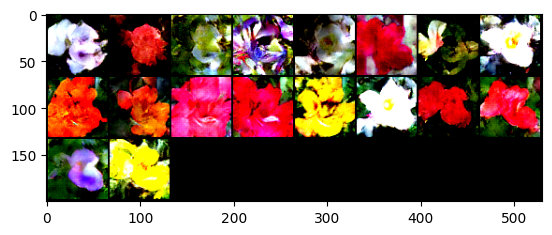

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 39, lossD:0.539219587354116, lossG:5.9357636460980165,lossG_fake:2.981437429062371, lossG_real:2.954326196202954 ,equality:0.02711123285941719


evaluate:130.28797912597656,kid_mean:0.08331955224275589, kid_std:0.039721742272377014,kid_:(tensor(0.0833), tensor(0.0397))


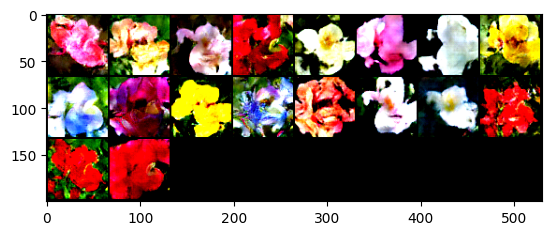

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 40, lossD:0.5153947249054909, lossG:5.952048023927559,lossG_fake:3.030463687424521, lossG_real:2.921584328980122 ,equality:0.108879358444399


evaluate:130.83218383789062,kid_mean:0.09538259357213974, kid_std:0.04697725176811218,kid_:(tensor(0.0954), tensor(0.0470))


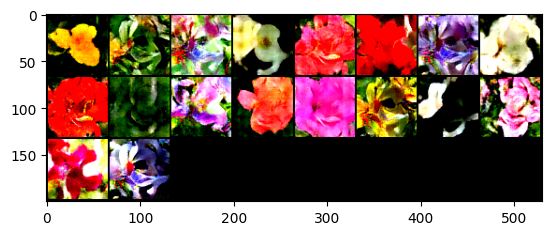

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 41, lossD:0.4841223936347128, lossG:5.992429830495594,lossG_fake:2.9945050477981567, lossG_real:2.9979247630221173 ,equality:-0.003419715223960562


evaluate:130.09561157226562,kid_mean:0.08725833147764206, kid_std:0.04266846925020218,kid_:(tensor(0.0873), tensor(0.0427))


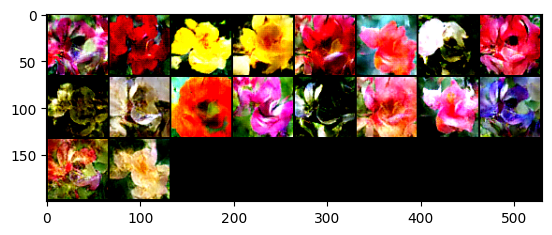

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 42, lossD:0.503151547127557, lossG:6.076116293379404,lossG_fake:3.0434846762314582, lossG_real:3.0326315997873694 ,equality:0.010853076444088838


evaluate:130.3071746826172,kid_mean:0.09440332651138306, kid_std:0.038652822375297546,kid_:(tensor(0.0944), tensor(0.0387))


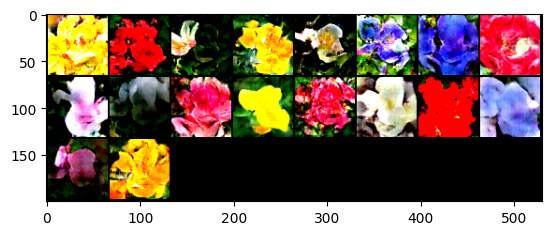

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 43, lossD:0.49132890695507087, lossG:6.100707919852248,lossG_fake:3.0948768547437724, lossG_real:3.00583106163636 ,equality:0.08904579310741223


evaluate:129.0410614013672,kid_mean:0.08978449553251266, kid_std:0.04110874608159065,kid_:(tensor(0.0898), tensor(0.0411))


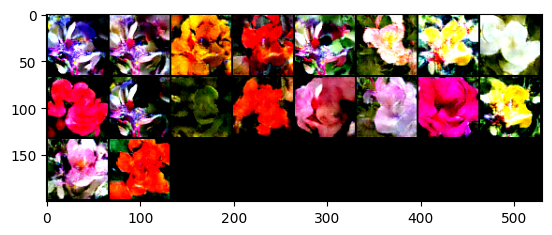

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 44, lossD:0.47219061023257314, lossG:6.089885568155826,lossG_fake:3.0645120398512162, lossG_real:3.025373524832494 ,equality:0.03913851501872223


evaluate:128.4979705810547,kid_mean:0.08177172392606735, kid_std:0.04363825172185898,kid_:(tensor(0.0818), tensor(0.0436))


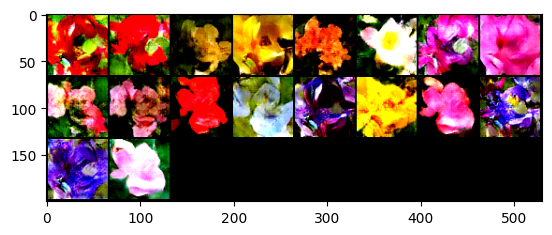

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 45, lossD:0.5395665308008495, lossG:5.999792029556719,lossG_fake:3.0513049827038663, lossG_real:2.948487072893717 ,equality:0.10281790981014938


evaluate:127.69973754882812,kid_mean:0.09392637014389038, kid_std:0.04454593360424042,kid_:(tensor(0.0939), tensor(0.0445))


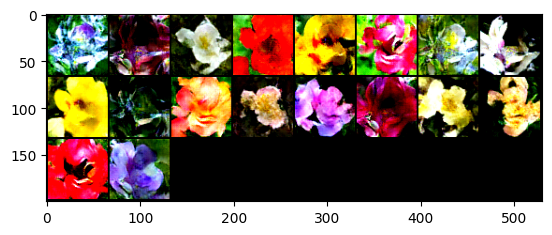

100%|██████████| 103/103 [00:27<00:00,  3.75it/s]


epoch: 46, lossD:0.42967586273562564, lossG:6.232592707698785,lossG_fake:3.1545208802500975, lossG_real:3.0780718332355463 ,equality:0.07644904701455113


evaluate:127.29156494140625,kid_mean:0.09001432359218597, kid_std:0.047742463648319244,kid_:(tensor(0.0900), tensor(0.0477))


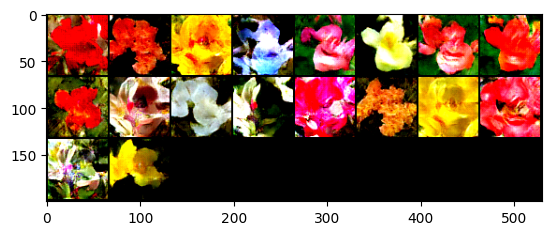

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 47, lossD:0.5279292032050277, lossG:6.111324370486065,lossG_fake:3.0348341667536394, lossG_real:3.0764902095192843 ,equality:-0.04165604276564494


evaluate:128.44284057617188,kid_mean:0.08927269279956818, kid_std:0.03812023624777794,kid_:(tensor(0.0893), tensor(0.0381))


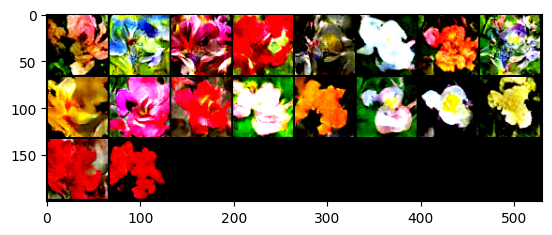

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 48, lossD:0.505259903310572, lossG:6.068476922303727,lossG_fake:3.0299604665307167, lossG_real:3.038516416133029 ,equality:-0.008555949602312207


evaluate:127.87083435058594,kid_mean:0.09179364889860153, kid_std:0.04147815704345703,kid_:(tensor(0.0918), tensor(0.0415))


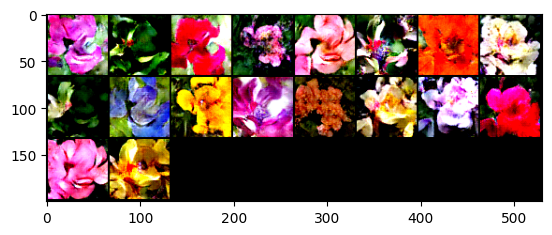

100%|██████████| 103/103 [00:27<00:00,  3.76it/s]


epoch: 49, lossD:0.4332772593909097, lossG:6.180914341824726,lossG_fake:3.0875522374238784, lossG_real:3.0933621138044933 ,equality:-0.00580987638061492


evaluate:128.81246948242188,kid_mean:0.0797262191772461, kid_std:0.040753088891506195,kid_:(tensor(0.0797), tensor(0.0408))


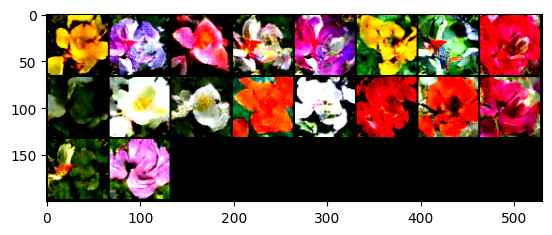

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

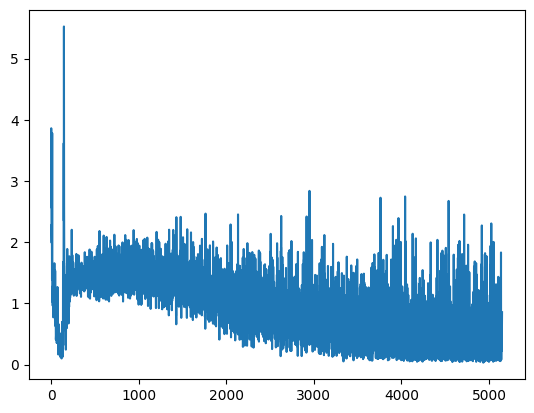

In [45]:
plt.plot(raw_lossesD)

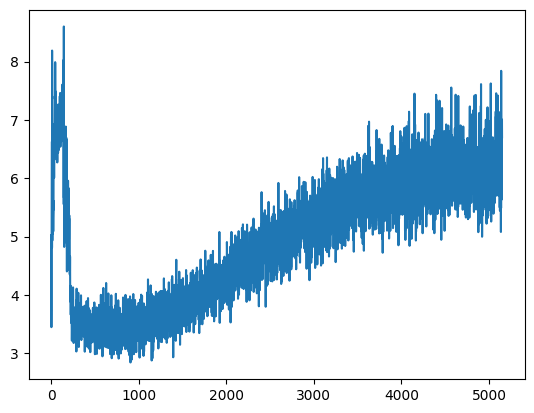

In [46]:
plt.plot(raw_lossesG)

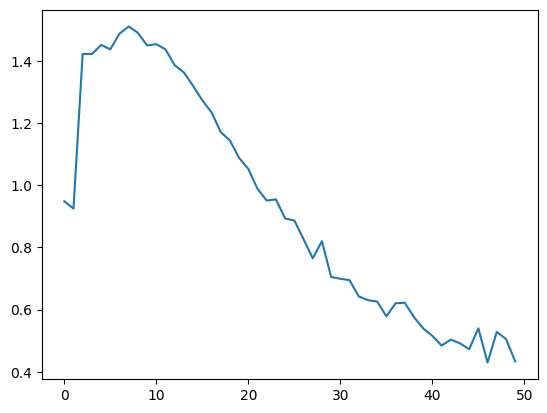

In [47]:
plt.plot(lossesD)

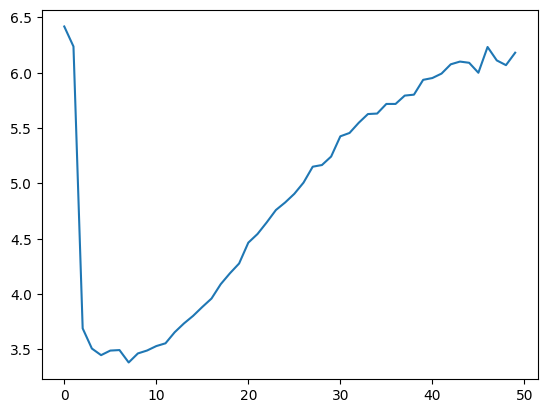

In [48]:
plt.plot(lossesG)

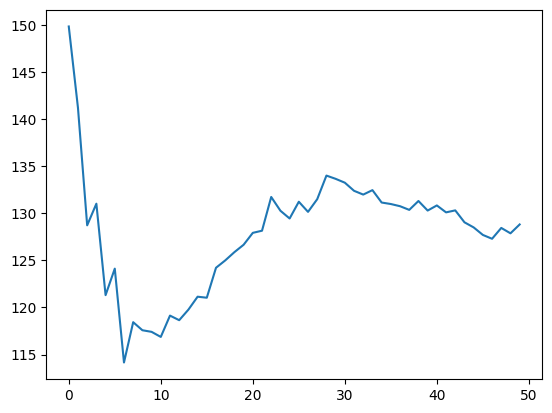

In [49]:
plt.plot(fid_)

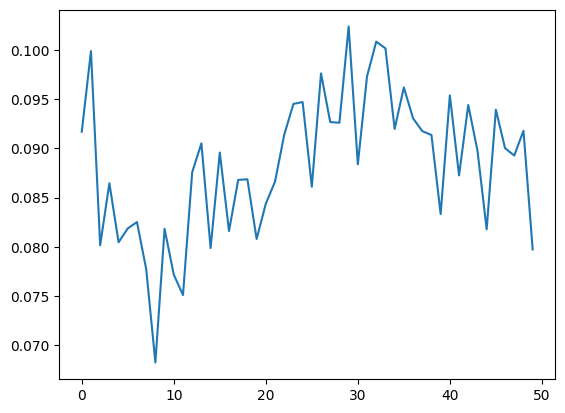

In [50]:
plt.plot(kid_mean_)

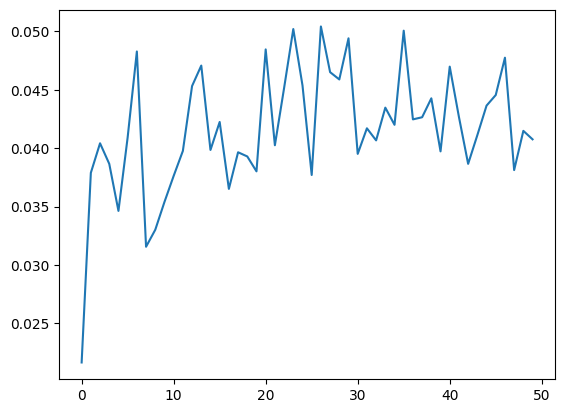

In [51]:
plt.plot(kid_std_)

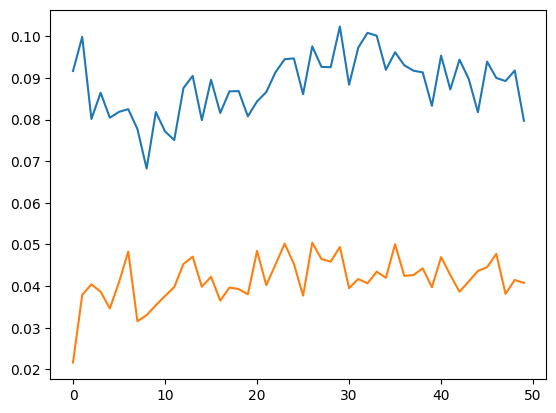

In [52]:
plt.plot(kid_score)

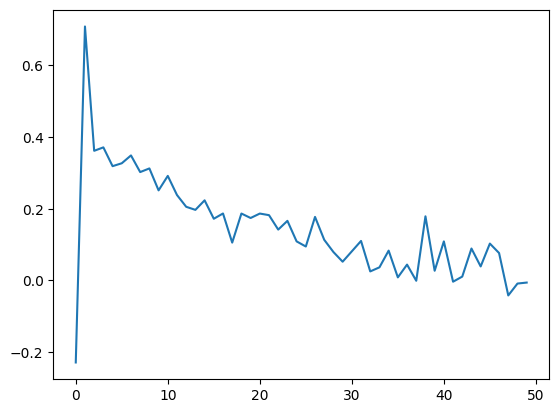

In [53]:
plt.plot(d_equality)

In [54]:

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
fid.compute()

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
kid.compute()

(tensor(0.0907), tensor(0.0474))